# Modify the Multi-lanes Code

In [10]:
%run ../Lanes.ipynb

Test 1: Empty Road
  Expected flow = 0, Actual flow = 0
  Expected jam fraction = 0, Actual jam fraction = 0
  PASS

Test 2: Full Road
  Expected jam fraction = 1, Actual jam fraction = 1.000
  PASS
[0. 0. 0. 0. 0.]
Totoal Average Flow: 0.6000229977003017
Total Jamming Fraction: 0.1500049995000679
[[-1 -1  2 -1 -1 -1  3 -1 -1 -1]
 [ 2  2 -1 -1  3 -1  0  2  2 -1]
 [-1 -1 -1  3  0 -1 -1 -1 -1  2]
 [-1 -1 -1  0 -1  3  1 -1 -1 -1]
 [ 2  2  3 -1  1  0 -1 -1  2 -1]
 [-1 -1  0  1 -1 -1 -1  3 -1  2]
 [ 1  1 -1 -1 -1  1  2  0  1 -1]
 [-1 -1  1 -1  2 -1 -1 -1 -1  1]
 [ 1  1 -1  2 -1 -1 -1  1  1 -1]
 [-1 -1 -1 -1 -1  2 -1 -1 -1  1]]


In [13]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.colors import ListedColormap, BoundaryNorm
from IPython.display import HTML

class Multi_Lane_Traffic_Colored:
    def __init__(self, cells=10, lanes=10, density=0, vmax=5, p=0.3, random_state=None):
        self.cells = cells
        self.lanes = lanes
        self.vmax = vmax
        self.p = p
        
        if random_state is not None:
             np.random.seed(random_state)
        
        # Two Grids: One for Speed, One for ID
        self.grid = -1 * np.ones((lanes, cells), dtype=int)
        self.id_grid = -1 * np.ones((lanes, cells), dtype=int)
        
        self.history = []     # Stores velocity grids
        self.id_history = []  # Stores ID grids

    def get_gap(self, grid, lane, cell):
        """Calculate empty cells ahead in a specific lane"""
        gap = 0
        for i in range(1, self.vmax + 2):
            next_cell = (cell + i) % self.cells
            if grid[lane][next_cell] != -1:
                return gap
            gap += 1
        return gap

    def step(self):
        current_grid = self.grid.copy()
        current_ids = self.id_grid.copy()
        
        intermediate_grid = -1 * np.ones_like(current_grid)
        intermediate_ids = -1 * np.ones_like(current_ids)
        
        new_grid = -1 * np.ones_like(current_grid)
        new_ids = -1 * np.ones_like(current_ids)
        
        # --- 1. LANE SWITCHING PHASE ---
        for lane in range(self.lanes):
            for cell in range(self.cells):
                vel = current_grid[lane][cell]
                car_id = current_ids[lane][cell]
                if vel == -1: continue 
                
                gap = self.get_gap(current_grid, lane, cell)
                desired_v = min(vel + 1, self.vmax)
                target_lane = lane
                
                # Try to switch if blocked
                if gap < desired_v:
                    left_lane = (lane - 1) % self.lanes
                    if current_grid[left_lane][cell] == -1:
                        left_gap = self.get_gap(current_grid, left_lane, cell)
                        if left_gap > gap:
                            target_lane = left_lane
                            gap = left_gap 
                    
                    if target_lane == lane:
                        right_lane = (lane + 1) % self.lanes
                        if current_grid[right_lane][cell] == -1:
                            right_gap = self.get_gap(current_grid, right_lane, cell)
                            if right_gap > gap:
                                target_lane = right_lane
                
                # Move BOTH velocity and ID to the intermediate grid
                intermediate_grid[target_lane][cell] = vel
                intermediate_ids[target_lane][cell] = car_id

        # --- 2. MOTION PHASE ---
        for lane in range(self.lanes):
            for cell in range(self.cells):
                vel = intermediate_grid[lane][cell]
                car_id = intermediate_ids[lane][cell]
                if vel == -1: continue
                
                # Standard NS Logic
                gap = self.get_gap(intermediate_grid, lane, cell)
                if vel < self.vmax: vel += 1
                if vel > gap: vel = gap
                if vel > 0 and np.random.rand() < self.p: vel -= 1
                
                new_pos = (cell + vel) % self.cells
                
                # Update BOTH grids at the new position
                new_grid[lane][new_pos] = vel
                new_ids[lane][new_pos] = car_id
        
        self.grid = new_grid
        self.id_grid = new_ids
        
        self.history.append(self.grid.copy())
        self.id_history.append(self.id_grid.copy())

    def simulate(self, n_step):
        self.history = [self.grid.copy()]
        self.id_history = [self.id_grid.copy()]
        for _ in range(n_step):
            self.step()

# Visualization

## Simple Test

In [14]:
# --- SETUP ---
model = Multi_Lane_Traffic_Colored(cells=10, lanes=5, density=0, vmax=5, p=0.2, random_state=42)

# Place 5 Cars with Unique IDs
# grid stores SPEED (starts at 5)
# id_grid stores ID (1 to 5)
initial_positions = [0, 1, 2, 3, 4]
for i, pos in enumerate(initial_positions):
    model.grid[2][pos] = 5       # Speed = 5
    model.id_grid[2][pos] = i + 1 # ID = 1, 2, 3, 4, 5

model.simulate(30)

# --- VISUALIZATION ---
fig, ax = plt.subplots(figsize=(8, 5))

# Define distinct colors for IDs
# 0 (Empty) = Gray
# 1 = Red, 2 = Orange, 3 = Yellow, 4 = Green, 5 = Blue
colors = ['#333333', '#FF0000', '#FFA500', '#FFFF00', '#00FF00', '#00FFFF']
cmap = ListedColormap(colors)
# Map values -1, 1, 2, 3, 4, 5 to these colors
bounds = [-1.5, 0.5, 1.5, 2.5, 3.5, 4.5, 5.5]
norm = BoundaryNorm(bounds, cmap.N)

def update(frame_idx):
    ax.clear()
    
    # Get Data
    vel_grid = model.history[frame_idx]  # For Numbers
    id_grid = model.id_history[frame_idx] # For Colors
    
    # Plot Colors (Using ID Grid)
    ax.imshow(id_grid, cmap=cmap, norm=norm, aspect='auto')
    
    # Plot Numbers (Using Velocity Grid)
    for l in range(model.lanes):
        for c in range(model.cells):
            # Check if there is a car (ID != -1)
            if id_grid[l][c] != -1:
                speed_val = vel_grid[l][c]
                ax.text(c, l, str(speed_val), ha='center', va='center', 
                        color='black', fontweight='bold', fontsize=12)

    # Grid Lines & Styling
    ax.set_xticks(np.arange(-0.5, model.cells, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, model.lanes, 1), minor=True)
    ax.grid(which='minor', color='white', linestyle='-', linewidth=2)
    ax.tick_params(which='minor', bottom=False, left=False)
    
    ax.set_title(f"Traffic Simulation - Step {frame_idx}")
    ax.set_xlabel("Position")
    ax.set_ylabel("Lane")

ani = animation.FuncAnimation(fig, update, frames=len(model.history), interval=500)
plt.close()

HTML(ani.to_jshtml())

## Multiple Cars in the larger grids

In [17]:
import matplotlib.cm as cm # <--- Need this to generate colors

# --- 1. SETUP MODEL ---
model = Multi_Lane_Traffic_Colored(cells=20, lanes=6, density=0, vmax=5, p=0.2, random_state=42)

# --- 2. PLACE 30 CARS ---
np.random.seed(123) 
cars_placed = 0
while cars_placed < 30: # Changed from 10 to 30
    l = np.random.randint(0, 6)
    c = np.random.randint(0, 20)
    if model.grid[l][c] == -1:
        model.grid[l][c] = np.random.randint(1, 6)
        model.id_grid[l][c] = cars_placed + 1 # IDs 1 to 30
        cars_placed += 1

model.simulate(100)

# --- 3. VISUALIZATION WITH 30 COLORS ---
fig, ax = plt.subplots(figsize=(10, 5))

# Generate 30 distinct colors automatically using the 'hsv' colormap
# We start with background gray, then append 30 rainbow colors
cmap_base = cm.get_cmap('hsv', 30)
colors = ['#333333'] # Background (-1)
for i in range(30):
    colors.append(cmap_base(i))

cmap = ListedColormap(colors)
# Adjust bounds for IDs 1 to 30
bounds = [-1.5] + [i + 0.5 for i in range(31)]
norm = BoundaryNorm(bounds, cmap.N)

def update(frame_idx):
    ax.clear()
    vel_grid = model.history[frame_idx]
    id_grid = model.id_history[frame_idx]
    
    ax.imshow(id_grid, cmap=cmap, norm=norm, aspect='auto')
    
    rows, cols = np.where(id_grid != -1)
    for l, c in zip(rows, cols):
        val = vel_grid[l][c]
        ax.text(c, l, str(val), ha='center', va='center', 
                color='black', fontweight='bold', fontsize=8)

    ax.set_xticks(np.arange(-0.5, model.cells, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, model.lanes, 1), minor=True)
    ax.grid(which='minor', color='white', linestyle='-', linewidth=0.5)
    ax.tick_params(which='minor', bottom=False, left=False)
    
    ax.set_title(f"Step {frame_idx} (30 Cars, Grid: 20x6)")

ani = animation.FuncAnimation(fig, update, frames=len(model.history), interval=200)
plt.close()
HTML(ani.to_jshtml())

C:\Users\USER\AppData\Local\Temp\ipykernel_34136\3428030082.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_base = cm.get_cmap('hsv', 30)


# Optimization (Monte Carlo Optimizer)

## Lane number (k), Car number (n), vector: car x(k,v_i+1) position - car x(k,v_i), Velocity (v)
I'm not sure know how to optimize their velocity, i.e. maximize their velcity throughout steps, but it will be something like this:
The energy would be like this?
$$
    E = \sum_{a=1}^{k} \sum_{i=1}^{n} (1 - \mathbf{v}_{a,i} \cdot \mathbf{v}_{a,i+1})
$$

"Perfect Spot": The cars moved around the grid until they found a position where they had enough empty space ahead of them. This empty space allowed them to reach a higher speed without being blocked.

"Highest Speed": Once in that spot, the optimizer adjusted their speed to be as high as possible



Starting Optimization... Initial Energy: -179
Optimization Complete. Final Energy: -702


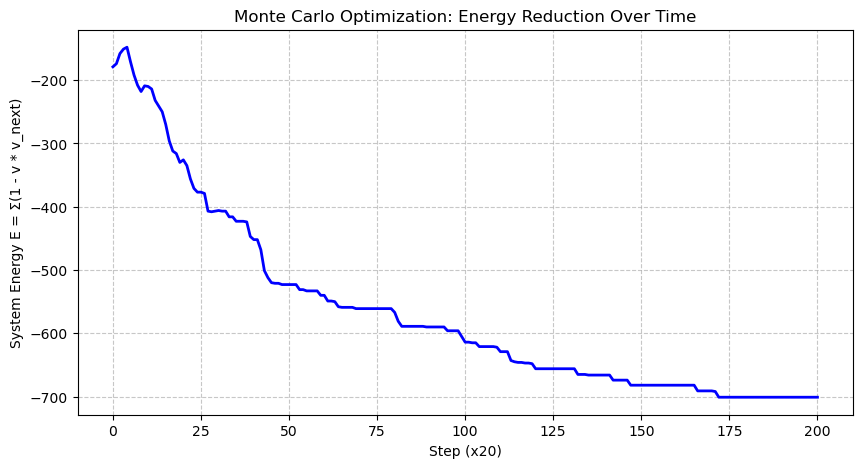

C:\Users\USER\AppData\Local\Temp\ipykernel_4292\1785025895.py:153: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_base = cm.get_cmap('hsv', 30)


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.animation as animation
from IPython.display import HTML, display

# --- 1. THE MONTE CARLO OPTIMIZER CLASS ---
class MonteCarloPositionOptimizer:
    def __init__(self, cells=20, lanes=6, n_cars=30, vmax=5, random_state=42):
        self.cells = cells
        self.lanes = lanes
        self.n_cars = n_cars
        self.vmax = vmax
        np.random.seed(random_state)
        
        # Initialize Grids
        self.grid = -1 * np.ones((lanes, cells), dtype=int)
        self.id_grid = -1 * np.ones((lanes, cells), dtype=int)
        self.car_locations = [] # Track (lane, cell) of each car
        
        # Place cars randomly
        count = 0
        while count < n_cars:
            l, c = np.random.randint(0, lanes), np.random.randint(0, cells)
            if self.grid[l][c] == -1:
                self.grid[l][c] = np.random.randint(0, vmax+1)
                self.id_grid[l][c] = count + 1
                self.car_locations.append([l, c]) # Use list to be mutable
                count += 1
        
        self.current_energy = self.calculate_total_energy()
        self.history = []     # To store grid states
        self.id_history = []  # To store ID positions
        self.energy_history = []

    def get_neighbors_in_lane(self, lane):
        # Return velocities in this lane
        return [self.grid[lane][c] for c in range(self.cells) if self.grid[lane][c] != -1]

    def calculate_total_energy(self):
        # The Formula: E = Sum(1 - v_current * v_next)
        total_energy = 0
        for l in range(self.lanes):
            cars = self.get_neighbors_in_lane(l)
            n = len(cars)
            if n < 2: continue
            
            for i in range(n):
                v_curr = cars[i]
                v_next = cars[(i + 1) % n] # Periodic boundary
                total_energy += (1 - v_curr * v_next)
        return total_energy

    def monte_carlo_step(self, temperature=1.0):
        # 1. Pick a random car
        idx = np.random.randint(0, self.n_cars)
        l_old, c_old = self.car_locations[idx]
        v_old = self.grid[l_old][c_old]
        id_val = self.id_grid[l_old][c_old]
        
        # 2. DECIDE: Move Position OR Change Velocity? (50/50 chance)
        action = np.random.choice(['move', 'velocity'])
        
        # Store old state to revert if needed
        l_new, c_new = l_old, c_old
        v_new = v_old
        
        if action == 'move':
            # Try to move to a random EMPTY spot
            # Optimization: Try 10 times to find an empty spot
            for _ in range(10):
                r_l = np.random.randint(0, self.lanes)
                r_c = np.random.randint(0, self.cells)
                if self.grid[r_l][r_c] == -1:
                    l_new, c_new = r_l, r_c
                    break
            if l_new == l_old and c_new == c_old: return # No empty spot found
            
        elif action == 'velocity':
            # Change velocity based on gap at CURRENT position
            gap = 0
            for i in range(1, self.vmax + 2):
                if self.grid[l_old][(c_old + i) % self.cells] != -1: break
                gap += 1
            max_v = min(self.vmax, gap)
            v_new = np.random.randint(0, max_v + 1) if max_v > 0 else 0
            if v_new == v_old: return

        # 3. Apply Change Temporarily
        self.grid[l_old][c_old] = -1
        self.id_grid[l_old][c_old] = -1
        
        self.grid[l_new][c_new] = v_new
        self.id_grid[l_new][c_new] = id_val
        self.car_locations[idx] = [l_new, c_new]
        
        # 4. Calculate Energy Change
        new_energy = self.calculate_total_energy()
        dE = new_energy - self.current_energy
        
        # 5. Metropolis Acceptance Criterion
        # Accept if Energy is lower OR with probability exp(-dE/T)
        if dE < 0 or np.random.rand() < np.exp(-dE / temperature):
            # Accept
            self.current_energy = new_energy
        else:
            # Reject: Revert everything
            self.grid[l_new][c_new] = -1
            self.id_grid[l_new][c_new] = -1
            
            self.grid[l_old][c_old] = v_old
            self.id_grid[l_old][c_old] = id_val
            self.car_locations[idx] = [l_old, c_old]

    def optimize(self, iterations=3000, start_temp=10.0, cooling_rate=0.995):
        self.history = [self.grid.copy()]
        self.id_history = [self.id_grid.copy()]
        self.energy_history = [self.current_energy]
        
        T = start_temp
        for i in range(iterations):
            self.monte_carlo_step(temperature=T)
            
            # Save data every 20 steps to make animation faster/lighter
            if i % 20 == 0: 
                self.history.append(self.grid.copy())
                self.id_history.append(self.id_grid.copy())
                self.energy_history.append(self.current_energy)
            
            T *= cooling_rate

# --- 2. RUN OPTIMIZATION ---
# Using 20x6 grid with 30 cars
optimizer = MonteCarloPositionOptimizer(cells=20, lanes=6, n_cars=30, vmax=5)
print(f"Starting Optimization... Initial Energy: {optimizer.current_energy}")
optimizer.optimize(iterations=4000)
print(f"Optimization Complete. Final Energy: {optimizer.current_energy}")

# --- 3. PLOT ENERGY VS STEPS ---
plt.figure(figsize=(10, 5))
plt.plot(optimizer.energy_history, color='blue', linewidth=2)
plt.title("Monte Carlo Optimization: Energy Reduction Over Time")
plt.xlabel("Step (x20)")
plt.ylabel("System Energy E = Σ(1 - v * v_next)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# --- 4. ANIMATION WITH TOOLBAR ---
fig, ax = plt.subplots(figsize=(10, 5))

# Generate 30 Distinct Colors
cmap_base = cm.get_cmap('hsv', 30)
colors = ['#333333'] + [cmap_base(i) for i in range(30)]
cmap = ListedColormap(colors)
bounds = [-1.5] + [i + 0.5 for i in range(31)]
norm = BoundaryNorm(bounds, cmap.N)

def update(frame_idx):
    ax.clear()
    vel_grid = optimizer.history[frame_idx]
    id_grid = optimizer.id_history[frame_idx]
    
    # Show Colors (Car IDs)
    ax.imshow(id_grid, cmap=cmap, norm=norm, aspect='auto')
    
    # Show Velocity Numbers
    rows, cols = np.where(id_grid != -1)
    for l, c in zip(rows, cols):
        val = vel_grid[l][c]
        ax.text(c, l, str(val), ha='center', va='center', 
                color='black', fontweight='bold', fontsize=9)

    ax.set_title(f"Optimization Step {frame_idx*20} | Energy: {optimizer.energy_history[frame_idx]:.2f}")
    ax.set_xticks(np.arange(-0.5, 20, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, 6, 1), minor=True)
    ax.grid(which='minor', color='white', linestyle='-', linewidth=1)
    ax.tick_params(which='minor', bottom=False, left=False)

# Create Animation
ani = animation.FuncAnimation(fig, update, frames=len(optimizer.history), interval=50)

# Display with Toolbar
plt.close() # Prevent static plot from showing
display(HTML(ani.to_jshtml()))